# Introduction 
( from course 100 Days of Code: The complete Pyton Pro Bootcamp for 2022 - Angela) 

Do higher film budgets lead to more revenue in the box office? In other words, should a movie studio spend more on a film to make more?  Let's find out if there's a relationship using the movie budgets and financial performance data that I've scraped from [the-numbers.com](https://www.the-numbers.com/movie/budgets) on **May 1st, 2018**. 

<img src=https://i.imgur.com/kq7hrEh.png>

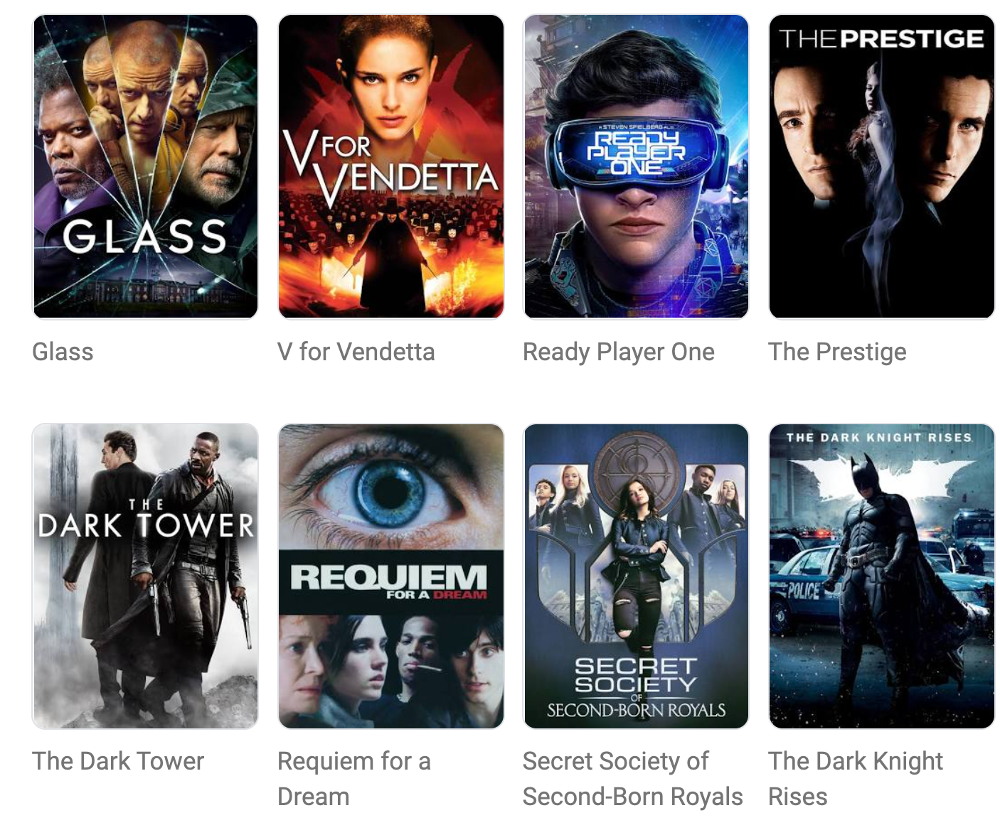

# Import Statements

In [167]:
import pandas as pd
import matplotlib.pyplot as plt


# Notebook Presentation

In [168]:
pd.options.display.float_format = '{:,.2f}'.format

from pandas.plotting import register_matplotlib_converters
register_matplotlib_converters()

# Read the Data

In [169]:
data = pd.read_csv('cost_revenue_dirty.csv')

# Explore and Clean the Data

**Challenge**: Answer these questions about the dataset:
1. How many rows and columns does the dataset contain?
2. Are there any NaN values present?
3. Are there any duplicate rows?
4. What are the data types of the columns?

In [170]:
data.head()

,Rank,Release_Date,Movie_Title,USD_Production_Budget,USD_Worldwide_Gross,USD_Domestic_Gross
0,5293,8/2/1915,The Birth of a Nation,"$110,000","$11,000,000","$10,000,000"
1,5140,5/9/1916,Intolerance,"$385,907",$0,$0
2,5230,12/24/1916,"20,000 Leagues Under the Sea","$200,000","$8,000,000","$8,000,000"
3,5299,9/17/1920,Over the Hill to the Poorhouse,"$100,000","$3,000,000","$3,000,000"
4,5222,1/1/1925,The Big Parade,"$245,000","$22,000,000","$11,000,000"


In [171]:
data.sample(10)

,Rank,Release_Date,Movie_Title,USD_Production_Budget,USD_Worldwide_Gross,USD_Domestic_Gross
2254,4987,7/5/2004,The Mudge Boy,"$800,000","$62,544","$62,544"
2426,3950,5/8/2005,Saint Ralph,"$5,200,000","$1,695,126","$795,126"
5252,1290,10/6/2016,The Conjuring 2: The Enfield Poltergeist,"$40,000,000","$311,270,008","$102,470,008"
1011,897,10/17/1997,Devil's Advocate,"$57,000,000","$153,007,424","$61,007,424"
4521,2059,12/25/2013,August: Osage County,"$25,000,000","$50,738,810","$37,738,810"
806,3998,9/29/1995,Halloween: The Curse of Michael Myers,"$5,000,000","$15,126,948","$15,126,948"
4788,3255,1/4/2015,Woman in Gold,"$11,000,000","$56,758,138","$33,307,793"
3752,128,10/12/2010,The Chronicles of Narnia: The Voyage of the Da...,"$155,000,000","$418,186,950","$104,386,950"
5014,4944,10/3/2015,The Pet,"$1,000,000",$0,$0
4013,4305,10/21/2011,Margin Call,"$3,400,000","$20,433,227","$5,353,586"


How many rows and columns does the dataset contain?

In [172]:
data.shape 

(5391, 6)

In [173]:
data.columns

Index(['Rank', 'Release_Date', 'Movie_Title', 'USD_Production_Budget',
       'USD_Worldwide_Gross', 'USD_Domestic_Gross'],
      dtype='object')

In [174]:
data.isna().values.sum()

0

In [175]:
data.duplicated().values.any()

False

In [176]:
duplicated_rows = data[data.duplicated()]
len(duplicated_rows)

0

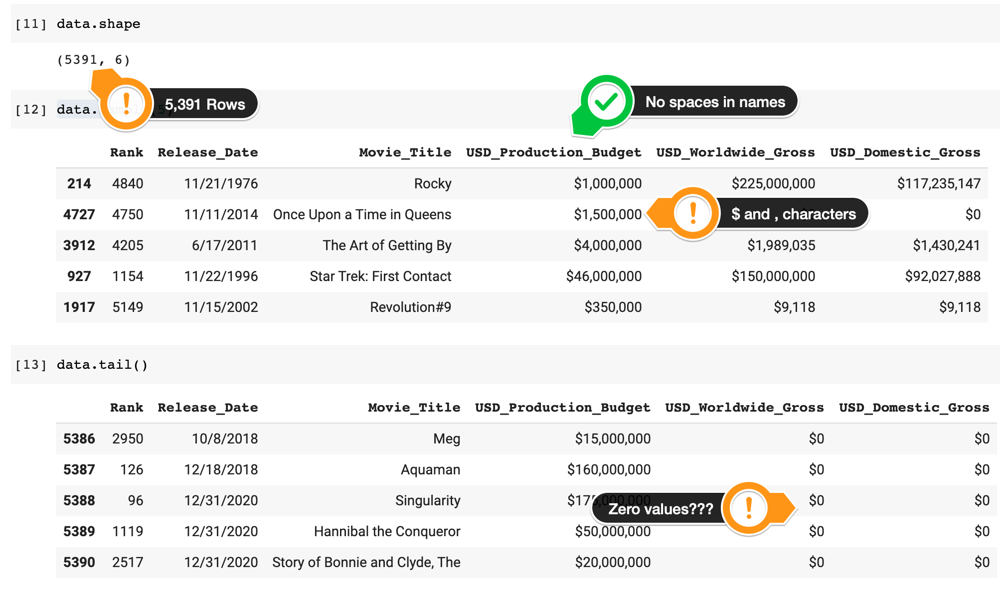

There are thousands of entries in the DataFrame - one entry for each movie. We'll have some challenges formatting the data before we can do more analysis because we have non-numeric characters in our budget and revenue columns.

In [177]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5391 entries, 0 to 5390
Data columns (total 6 columns):
 #   Column                 Non-Null Count  Dtype 
---  ------                 --------------  ----- 
 0   Rank                   5391 non-null   int64 
 1   Release_Date           5391 non-null   object
 2   Movie_Title            5391 non-null   object
 3   USD_Production_Budget  5391 non-null   object
 4   USD_Worldwide_Gross    5391 non-null   object
 5   USD_Domestic_Gross     5391 non-null   object
dtypes: int64(1), object(5)
memory usage: 252.8+ KB


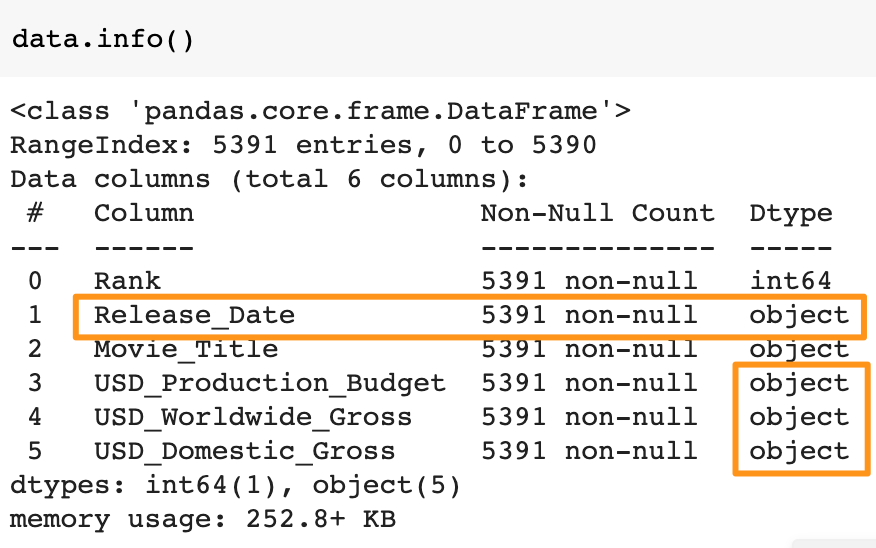

### Data Type Conversions

**Challenge**: Convert the `USD_Production_Budget`, `USD_Worldwide_Gross`, and `USD_Domestic_Gross` columns to a numeric format by removing `$` signs and `,`. 
<br>
<br>
Note that *domestic* in this context refers to the United States.

In [178]:
data_to_numeric = data

In [179]:
data_to_numeric["USD_Production_Budget"] = data_to_numeric["USD_Production_Budget"].astype(str).str.replace('$',"", regex=True)

In [180]:
data_to_numeric["USD_Worldwide_Gross"] = data_to_numeric["USD_Worldwide_Gross"].astype(str).str.replace('$',"", regex=True)

In [181]:
data_to_numeric["USD_Domestic_Gross"] = data_to_numeric["USD_Domestic_Gross"].astype(str).str.replace('$',"", regex=True)

In [182]:
data_to_numeric["USD_Production_Budget"] = pd.to_numeric(data_to_numeric["USD_Production_Budget"].astype(str).str.replace(',','', regex=True))

In [183]:
data_to_numeric["USD_Worldwide_Gross"] = pd.to_numeric(data_to_numeric["USD_Worldwide_Gross"].astype(str).str.replace(',','', regex=True))

In [184]:
data_to_numeric["USD_Domestic_Gross"] = pd.to_numeric(data_to_numeric["USD_Domestic_Gross"].astype(str).str.replace(',','', regex=True))

More elgant way todo that is: 

In order to convert the data in the budget and revenue columns and remove all the non-numeric characters, we can use a nested for loop. We create two Python lists: the characters to remove and the column names. Inside the nested loop we can combine .replace() and .to_numeric() to achieve our goal.

In [185]:
chars_to_remove = [',', '$']
columns_to_clean = ['USD_Production_Budget', 
                    'USD_Worldwide_Gross',
                    'USD_Domestic_Gross']
 
for col in columns_to_clean:
    for char in chars_to_remove:
        # Replace each character with an empty string
        data[col] = data[col].astype(str).str.replace(char, "")
    # Convert column to a numeric data type
    data[col] = pd.to_numeric(data[col])

C:\Users\Leon\AppData\Local\Temp\ipykernel_38836\3675212536.py:9: FutureWarning: The default value of regex will change from True to False in a future version. In addition, single character regular expressions will*not* be treated as literal strings when regex=True.
  data[col] = data[col].astype(str).str.replace(char, "")


In [186]:
data.head()

,Rank,Release_Date,Movie_Title,USD_Production_Budget,USD_Worldwide_Gross,USD_Domestic_Gross
0,5293,8/2/1915,The Birth of a Nation,110000,11000000,10000000
1,5140,5/9/1916,Intolerance,385907,0,0
2,5230,12/24/1916,"20,000 Leagues Under the Sea",200000,8000000,8000000
3,5299,9/17/1920,Over the Hill to the Poorhouse,100000,3000000,3000000
4,5222,1/1/1925,The Big Parade,245000,22000000,11000000


In [187]:
data_to_numeric.head()

,Rank,Release_Date,Movie_Title,USD_Production_Budget,USD_Worldwide_Gross,USD_Domestic_Gross
0,5293,8/2/1915,The Birth of a Nation,110000,11000000,10000000
1,5140,5/9/1916,Intolerance,385907,0,0
2,5230,12/24/1916,"20,000 Leagues Under the Sea",200000,8000000,8000000
3,5299,9/17/1920,Over the Hill to the Poorhouse,100000,3000000,3000000
4,5222,1/1/1925,The Big Parade,245000,22000000,11000000


In [188]:
type(data_to_numeric["USD_Domestic_Gross"][0])

numpy.int64

**Challenge**: Convert the `Release_Date` column to a Pandas Datetime type. 

In [189]:
data_to_numeric.Release_Date = pd.to_datetime(data_to_numeric.Release_Date)

In [190]:
type(data_to_numeric.Release_Date[0])

pandas._libs.tslibs.timestamps.Timestamp

In [191]:
data_to_numeric.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5391 entries, 0 to 5390
Data columns (total 6 columns):
 #   Column                 Non-Null Count  Dtype         
---  ------                 --------------  -----         
 0   Rank                   5391 non-null   int64         
 1   Release_Date           5391 non-null   datetime64[ns]
 2   Movie_Title            5391 non-null   object        
 3   USD_Production_Budget  5391 non-null   int64         
 4   USD_Worldwide_Gross    5391 non-null   int64         
 5   USD_Domestic_Gross     5391 non-null   int64         
dtypes: datetime64[ns](1), int64(4), object(1)
memory usage: 252.8+ KB


In [192]:
data_to_numeric.head()

,Rank,Release_Date,Movie_Title,USD_Production_Budget,USD_Worldwide_Gross,USD_Domestic_Gross
0,5293,1915-08-02,The Birth of a Nation,110000,11000000,10000000
1,5140,1916-05-09,Intolerance,385907,0,0
2,5230,1916-12-24,"20,000 Leagues Under the Sea",200000,8000000,8000000
3,5299,1920-09-17,Over the Hill to the Poorhouse,100000,3000000,3000000
4,5222,1925-01-01,The Big Parade,245000,22000000,11000000


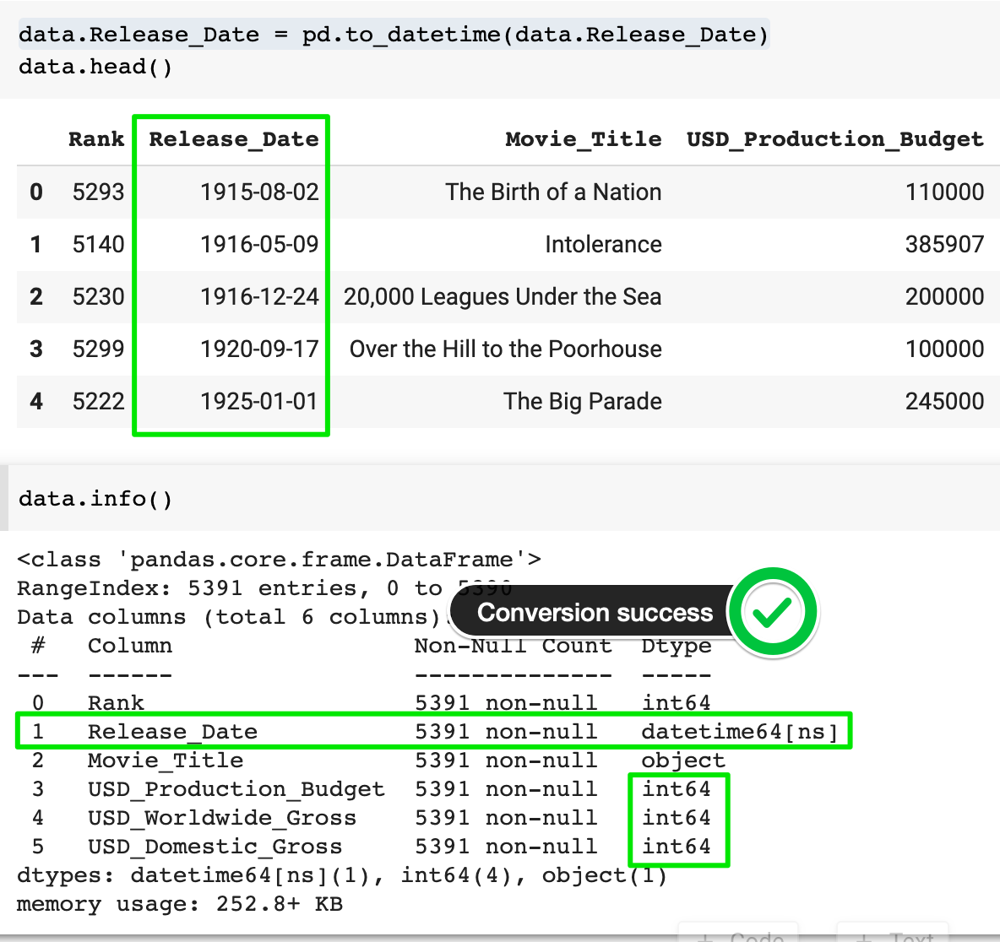

### Descriptive Statistics

**Challenge**: 

1. What is the average production budget of the films in the data set?
2. What is the average worldwide gross revenue of films?
3. What were the minimums for worldwide and domestic revenue?
4. Are the bottom 25% of films actually profitable or do they lose money?
5. What are the highest production budget and highest worldwide gross revenue of any film?
6. How much revenue did the lowest and highest budget films make?

In [193]:
data_to_numeric.describe()

,Rank,USD_Production_Budget,USD_Worldwide_Gross,USD_Domestic_Gross
count,"5,391.00","5,391.00","5,391.00","5,391.00"
mean,"2,696.00","31,113,737.58","88,855,421.96","41,235,519.44"
std,"1,556.39","40,523,796.88","168,457,757.00","66,029,346.27"
min,1.00,"1,100.00",0.00,0.00
25%,"1,348.50","5,000,000.00","3,865,206.00","1,330,901.50"
50%,"2,696.00","17,000,000.00","27,450,453.00","17,192,205.00"
75%,"4,043.50","40,000,000.00","96,454,455.00","52,343,687.00"
max,"5,391.00","425,000,000.00","2,783,918,982.00","936,662,225.00"


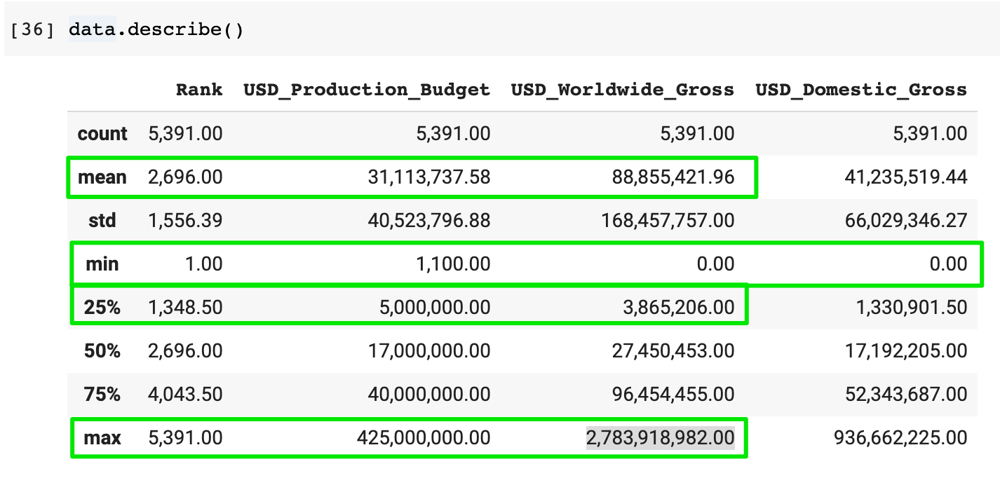
The average film costs about 31 million to make and makes around 3x that (or ~$89m) in worldwide revenue. So that's encouraging.

But quite a lot of films lose money too. In fact, all the films in the bottom quartile lose money, since the average cost is 5 million and they only bring in 3.8m in worldwide revenue!

The minimum domestic and worldwide revenue is 0. That makes sense. If a film never gets screened or is cancelled, then this is the number we would expect to see here.

On the other hand, the highest production budget was 425,000,000 and the highest worldwide revenue was 2,783,918,982. $2.7 Billion revenue! Holy smokes.

So which film was the lowest budget film in the dataset?

In [194]:
print(data_to_numeric[data_to_numeric["USD_Production_Budget"]==1100])

      Rank Release_Date        Movie_Title  USD_Production_Budget  \
2427  5391   2005-05-08  My Date With Drew                   1100   

      USD_Worldwide_Gross  USD_Domestic_Gross  
2427               181041              181041  


I've ... never heard of this film. But it looks like a real money maker. It grossed 181,041 with a measly 1,100 budget. 😮 Wow. Talk about return on investment!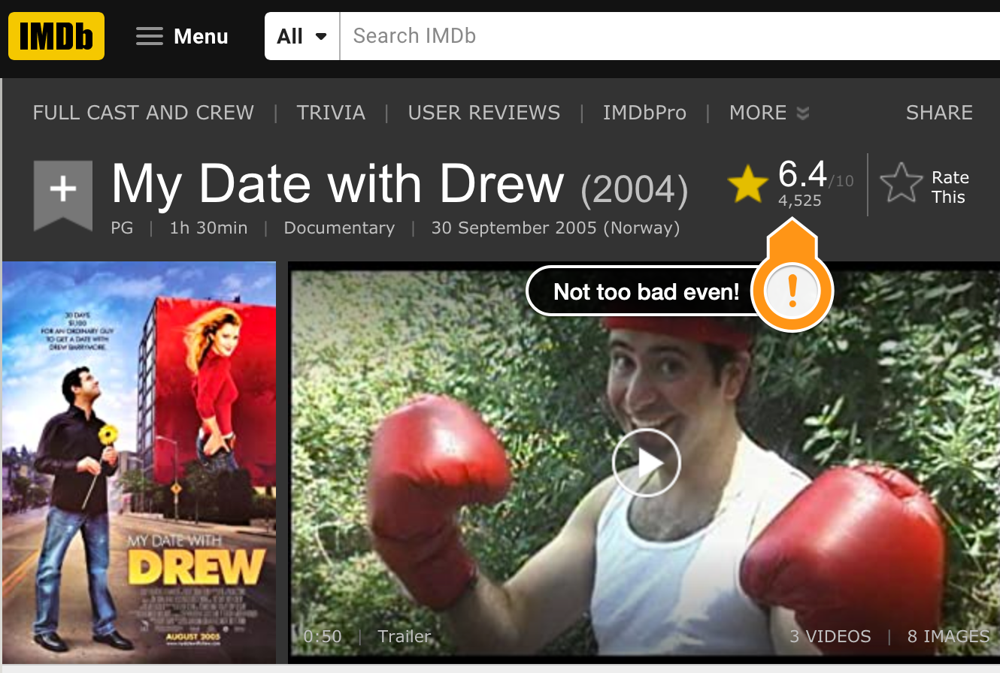

And the highest budget film in the dataset is:

In [195]:
print(data_to_numeric[data_to_numeric["USD_Production_Budget"]==425000000])

      Rank Release_Date Movie_Title  USD_Production_Budget  \
3529     1   2009-12-18      Avatar              425000000   

      USD_Worldwide_Gross  USD_Domestic_Gross  
3529           2783918982           760507625  


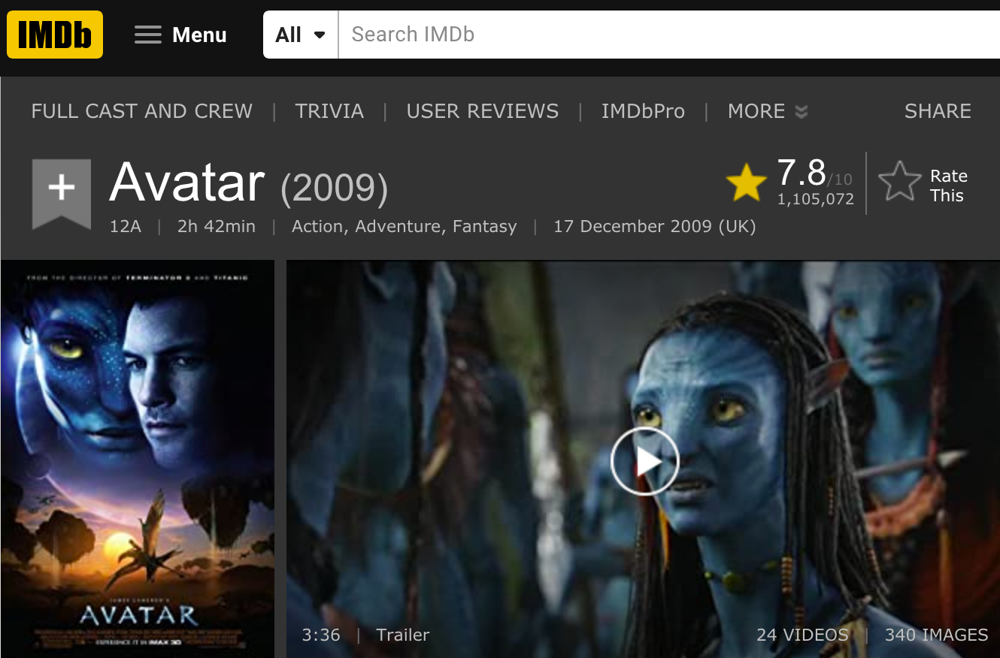

In [196]:
print(data_to_numeric[data_to_numeric["USD_Domestic_Gross"]==0].count())

Rank                     512
Release_Date             512
Movie_Title              512
USD_Production_Budget    512
USD_Worldwide_Gross      512
USD_Domestic_Gross       512
dtype: int64


We see that there are 512 films in the dataset that had no revenue in the United States. However, the highest budget films with no revenue have a release date AFTER the date on which the dataset was compiled (May 1st, 2018).

In [197]:
zero_domestic = data[data.USD_Domestic_Gross == 0]
print(f'Number of films that grossed $0 domestically {len(zero_domestic)}')
zero_domestic.sort_values('USD_Production_Budget', ascending=False)

Number of films that grossed $0 domestically 512


,Rank,Release_Date,Movie_Title,USD_Production_Budget,USD_Worldwide_Gross,USD_Domestic_Gross
5388,96,2020-12-31,Singularity,175000000,0,0
5387,126,2018-12-18,Aquaman,160000000,0,0
5384,321,2018-09-03,A Wrinkle in Time,103000000,0,0
5385,366,2018-10-08,Amusement Park,100000000,0,0
5090,556,2015-12-31,"Don Gato, el inicio de la pandilla",80000000,4547660,0
...,...,...,...,...,...,...
4787,5371,2014-12-31,Stories of Our Lives,15000,0,0
3056,5374,2007-12-31,Tin Can Man,12000,0,0
4907,5381,2015-05-19,Family Motocross,10000,0,0
5006,5389,2015-09-29,Signed Sealed Delivered,5000,0,0


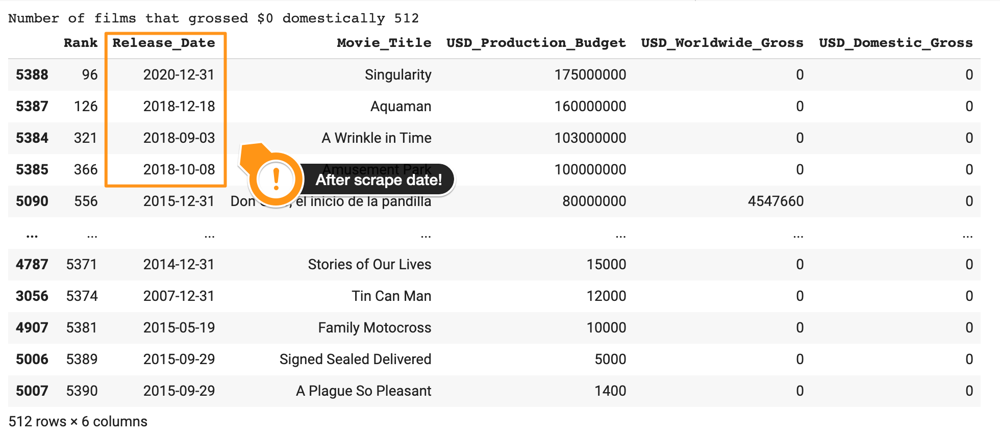

In [198]:
zero_worldwide = data[data.USD_Worldwide_Gross == 0]
print(f'Number of films that grossed $0 worldwide {len(zero_worldwide)}')
zero_worldwide.sort_values('USD_Production_Budget', ascending=False)

Number of films that grossed $0 worldwide 357


,Rank,Release_Date,Movie_Title,USD_Production_Budget,USD_Worldwide_Gross,USD_Domestic_Gross
5388,96,2020-12-31,Singularity,175000000,0,0
5387,126,2018-12-18,Aquaman,160000000,0,0
5384,321,2018-09-03,A Wrinkle in Time,103000000,0,0
5385,366,2018-10-08,Amusement Park,100000000,0,0
5058,880,2015-11-12,The Ridiculous 6,60000000,0,0
...,...,...,...,...,...,...
4787,5371,2014-12-31,Stories of Our Lives,15000,0,0
3056,5374,2007-12-31,Tin Can Man,12000,0,0
4907,5381,2015-05-19,Family Motocross,10000,0,0
5006,5389,2015-09-29,Signed Sealed Delivered,5000,0,0


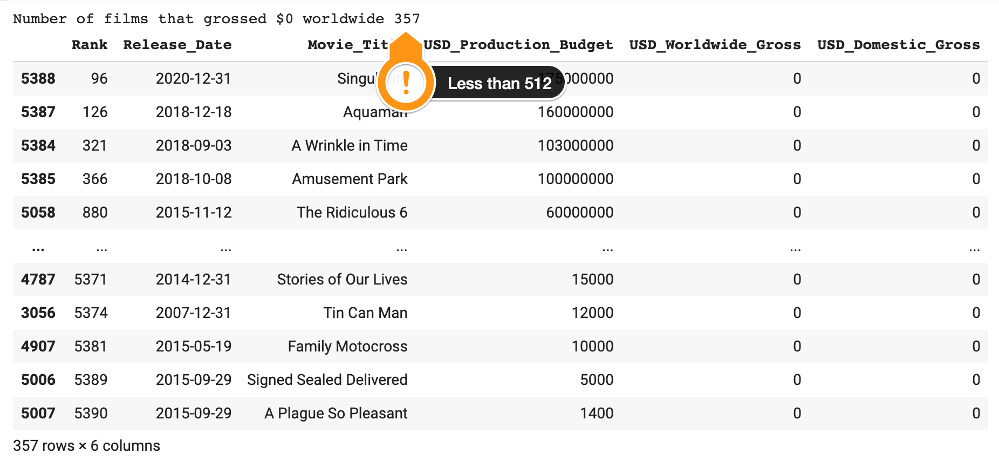

When we check worldwide revenue instead, we see that there are 357 films that made no money internationally. Once again, some of the films have not been released yet at the time the data was compiled. However, 512 versus 357. Why is there a difference? 

The reason some international films were never screened in the United States.  In fact, we can see an example of this in our previous screenshot. "Don Gato, el inicio de la pandilla" made about 4.5 million dollars in the box office, but nothing in the United States. Perhaps they should have screened it there too, considering it cost 80 million to make!

In [199]:
international_releases = data.loc[(data.USD_Domestic_Gross == 0) & 
                                  (data.USD_Worldwide_Gross != 0)]

In [200]:
international_releases

,Rank,Release_Date,Movie_Title,USD_Production_Budget,USD_Worldwide_Gross,USD_Domestic_Gross
71,4310,1956-02-16,Carousel,3380000,3220,0
1579,5087,2001-02-11,Everything Put Together,500000,7890,0
1744,3695,2001-12-31,The Hole,7500000,10834406,0
2155,4236,2003-12-31,Nothing,4000000,63180,0
2203,2513,2004-03-31,The Touch,20000000,5918742,0
...,...,...,...,...,...,...
5340,1506,2017-04-14,Queen of the Desert,36000000,1480089,0
5348,2225,2017-05-05,Chāi dàn zhuānjiā,23000000,58807172,0
5360,4832,2017-07-03,Departure,1100000,27561,0
5372,1856,2017-08-25,Ballerina,30000000,48048527,0


Use the Pandas .query() function to accomplish the same thing.

In [201]:
international_releases = data.query('USD_Domestic_Gross == 0 and USD_Worldwide_Gross != 0')
print(f'Number of international releases: {len(international_releases)}')
international_releases.tail()

Number of international releases: 155


,Rank,Release_Date,Movie_Title,USD_Production_Budget,USD_Worldwide_Gross,USD_Domestic_Gross
5340,1506,2017-04-14,Queen of the Desert,36000000,1480089,0
5348,2225,2017-05-05,Chāi dàn zhuānjiā,23000000,58807172,0
5360,4832,2017-07-03,Departure,1100000,27561,0
5372,1856,2017-08-25,Ballerina,30000000,48048527,0
5374,4237,2017-08-25,Polina danser sa vie,4000000,36630,0


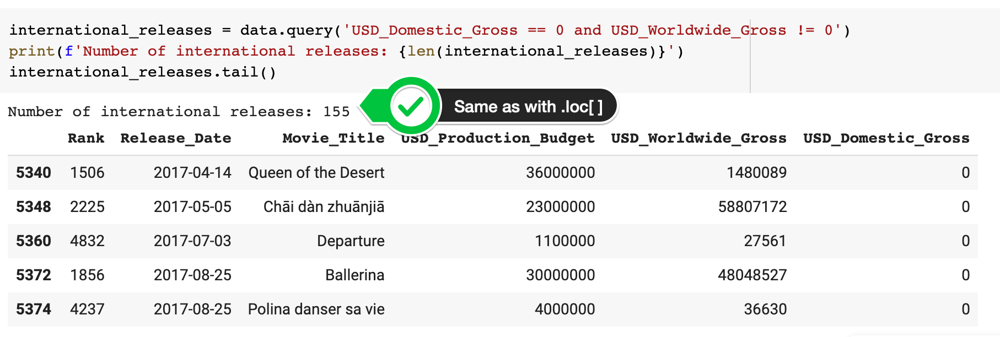

### Unreleased Films

**Challenge**:
* Identify which films were not released yet as of the time of data collection (May 1st, 2018).
* How many films are included in the dataset that have not yet had a chance to be screened in the box office? 
* Create another DataFrame called data_clean that does not include these films. 

In [202]:
# Date of Data Collection
scrape_date = pd.Timestamp('2018-5-1')

In [205]:
future_releases = data[data.Release_Date >= scrape_date]
future_releases
data_to_numeric = data.drop(future_releases.index)

In [209]:
print(len(future_releases))
future_releases

7


,Rank,Release_Date,Movie_Title,USD_Production_Budget,USD_Worldwide_Gross,USD_Domestic_Gross
5384,321,2018-09-03,A Wrinkle in Time,103000000,0,0
5385,366,2018-10-08,Amusement Park,100000000,0,0
5386,2950,2018-10-08,Meg,15000000,0,0
5387,126,2018-12-18,Aquaman,160000000,0,0
5388,96,2020-12-31,Singularity,175000000,0,0
5389,1119,2020-12-31,Hannibal the Conqueror,50000000,0,0
5390,2517,2020-12-31,"Story of Bonnie and Clyde, The",20000000,0,0


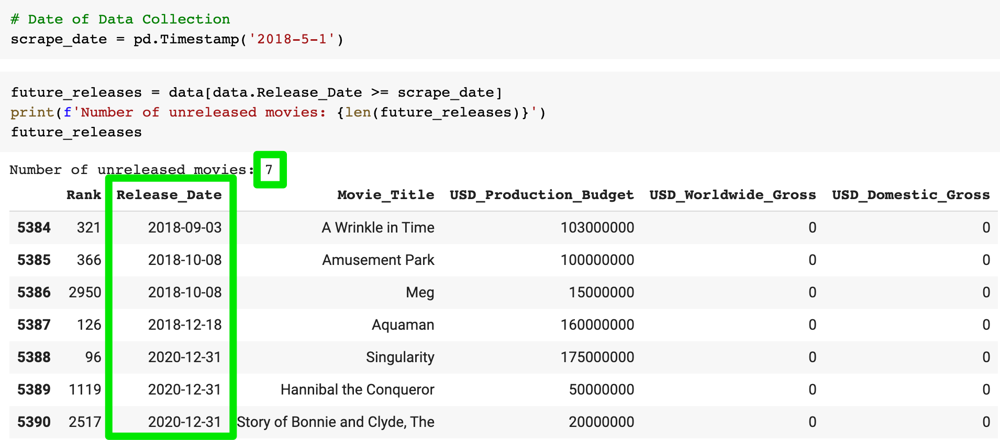

In [210]:
data_clean = data.drop(future_releases.index)

### Films that Lost Money

**Challenge**: 
What is the percentage of films where the production costs exceeded the worldwide gross revenue? 

In [228]:
data_to_numeric = data.drop(future_releases.index)

In [229]:
data_to_numeric["Revenue"] = data_to_numeric["USD_Worldwide_Gross"]+data_to_numeric["USD_Domestic_Gross"]-data_to_numeric["USD_Production_Budget"]

In [230]:
data_to_numeric.head()

,Rank,Release_Date,Movie_Title,USD_Production_Budget,USD_Worldwide_Gross,USD_Domestic_Gross,Revenue
0,5293,1915-08-02,The Birth of a Nation,110000,11000000,10000000,20890000
1,5140,1916-05-09,Intolerance,385907,0,0,-385907
2,5230,1916-12-24,"20,000 Leagues Under the Sea",200000,8000000,8000000,15800000
3,5299,1920-09-17,Over the Hill to the Poorhouse,100000,3000000,3000000,5900000
4,5222,1925-01-01,The Big Parade,245000,22000000,11000000,32755000


In [231]:
data_to_numeric.Revenue.count()

5384

In [232]:
data_money_losing = data_to_numeric[data_to_numeric.Revenue<0] 
data_money_winning = data_to_numeric[data_to_numeric.Revenue>0]

In [233]:
len(data_money_losing)/len(data_to_numeric)

0.2810178306092125

In both cases, we see that a whopping 28.1 precent 😮 of films do not recoup their production budget at the box office. 💸💸💸 Who knew that film finance is med risky!

In [239]:
data_money_losing

,Rank,Release_Date,Movie_Title,USD_Production_Budget,USD_Worldwide_Gross,USD_Domestic_Gross,Revenue
1,5140,1916-05-09,Intolerance,385907,0,0,-385907
6,4630,1927-12-08,Wings,2000000,0,0,-2000000
8,4240,1930-01-01,Hell's Angels,4000000,0,0,-4000000
15,4738,1936-05-02,Modern Times,1500000,165049,163245,-1171706
17,4814,1936-10-20,"Charge of the Light Brigade, The",1200000,0,0,-1200000
...,...,...,...,...,...,...,...
5366,79,2017-07-21,Valerian and the City of a Thousand Planets,180000000,52573132,31023132,-96403736
5371,4901,2017-07-28,An Inconvenient Sequel,1000000,130874,130874,-738252
5373,2161,2017-08-25,Tulip Fever,25000000,0,0,-25000000
5374,4237,2017-08-25,Polina danser sa vie,4000000,36630,0,-3963370


In [240]:
data_money_losing.Revenue.count()/data_to_numeric.Revenue.count()

0.2810178306092125

In [241]:
money_losing = data_clean.loc[data_clean.USD_Production_Budget > data_clean.USD_Worldwide_Gross + data_clean.USD_Domestic_Gross]
len(money_losing)/len(data_clean)

0.2810178306092125

In [242]:
len(money_losing)

1513

In [243]:
money_losing = data_clean.query('USD_Production_Budget > USD_Worldwide_Gross')
money_losing.shape[0]/data_clean.shape[0]

0.37277117384843983

with out USD_Domestic_Gross

# Seaborn for Data Viz: Bubble Charts

In [244]:
import seaborn as sns

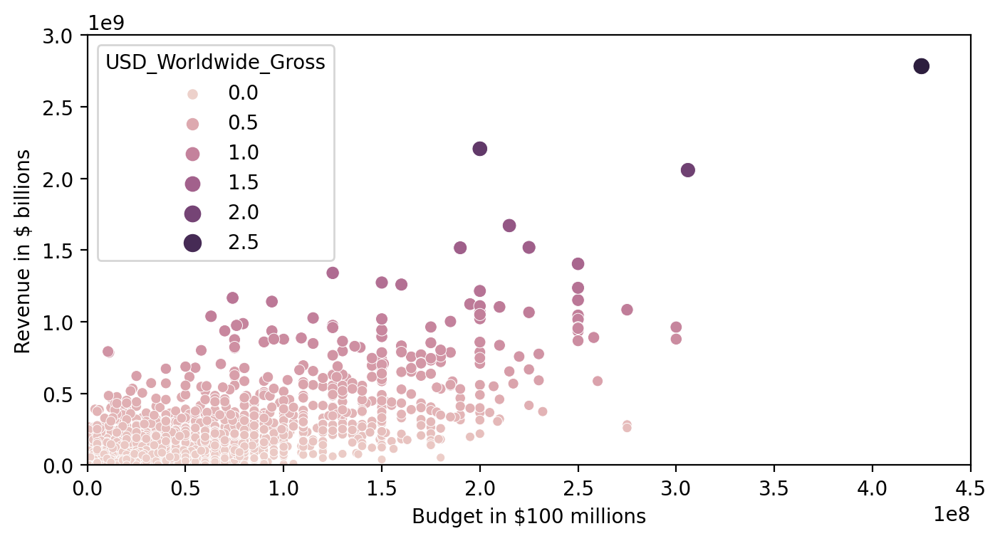

In [251]:
plt.figure(figsize=(8,4), dpi=200)
ax = sns.scatterplot(data=data_clean,
                     x='USD_Production_Budget', 
                     y='USD_Worldwide_Gross',
                     hue='USD_Worldwide_Gross', # colour
                     size='USD_Worldwide_Gross',) # dot size
ax.set(ylim=(0, 3000000000),
       xlim=(0, 450000000),
       ylabel='Revenue in $ billions',
       xlabel='Budget in $100 millions')
plt.show()

But the reason we're using Seaborn is because of the hue and size parameters that make it very easy to create a bubble chart. These parameters allow us to colour the data and change their size according to one of the columns in our DataFrame.

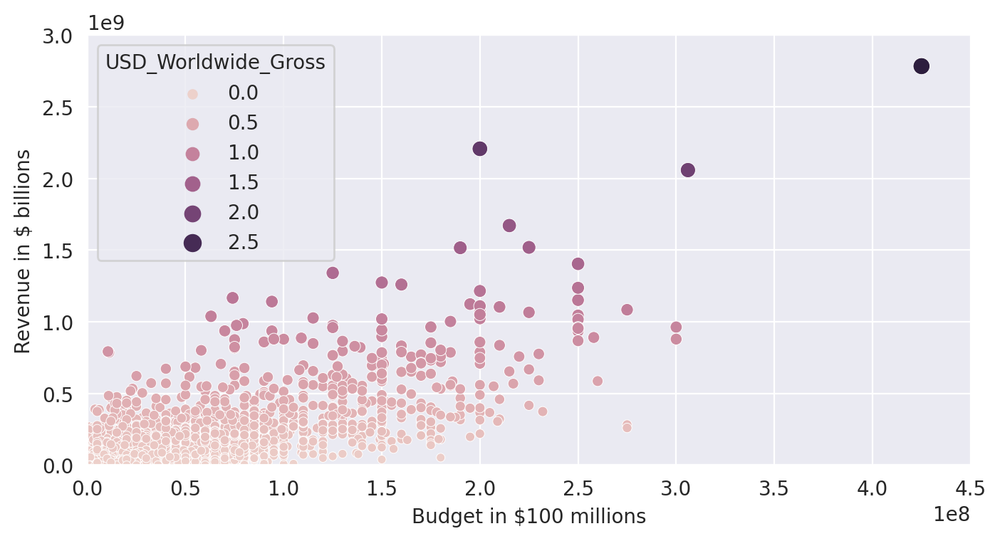

In [256]:
plt.figure(figsize=(8,4), dpi=200)
 
# set styling on a single chart
with sns.axes_style('darkgrid'):#whitegrid, dark, ticks
  ax = sns.scatterplot(data=data_clean,
                       x='USD_Production_Budget', 
                       y='USD_Worldwide_Gross',
                       hue='USD_Worldwide_Gross',
                       size='USD_Worldwide_Gross')
 
  ax.set(ylim=(0, 3000000000),
        xlim=(0, 450000000),
        ylabel='Revenue in $ billions',
        xlabel='Budget in $100 millions')

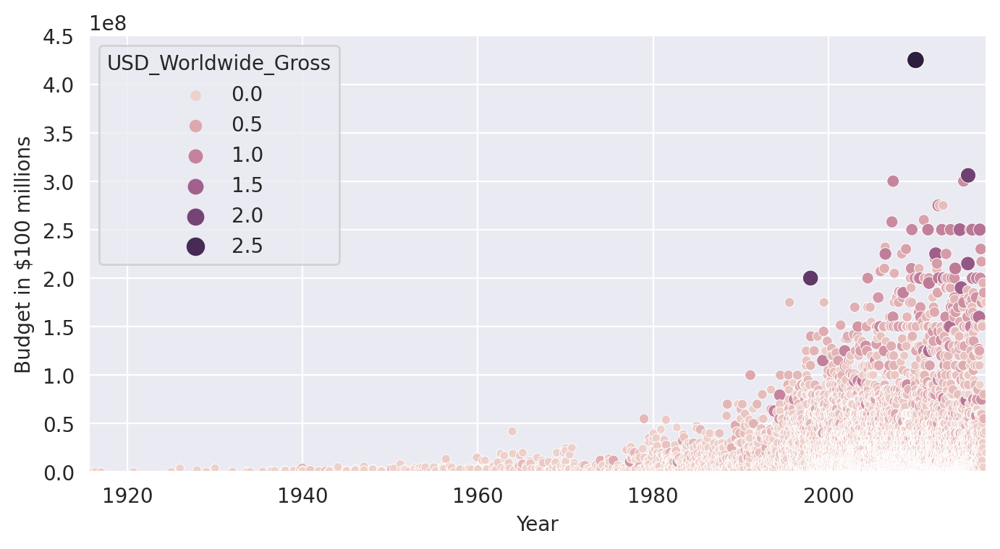

In [257]:
plt.figure(figsize=(8,4), dpi=200)
 
with sns.axes_style("darkgrid"):
    ax = sns.scatterplot(data=data_clean, 
                    x='Release_Date', 
                    y='USD_Production_Budget',
                    hue='USD_Worldwide_Gross',
                    size='USD_Worldwide_Gross',)
 
    ax.set(ylim=(0, 450000000),
           xlim=(data_clean.Release_Date.min(), data_clean.Release_Date.max()),
           xlabel='Year',
           ylabel='Budget in $100 millions')

What do we see here? What is this chart telling us? Well, first off, movie budgets have just exploded in the last 40 years or so. Up until the 1970s, the film industry appears to have been in an entirely different era. Budgets started growing fast from the 1980s onwards and continued to grow through the 2000s. Also, the industry has grown massively, producing many more films than before. The number of data points is so dense from 2000 onwards that they are overlapping.

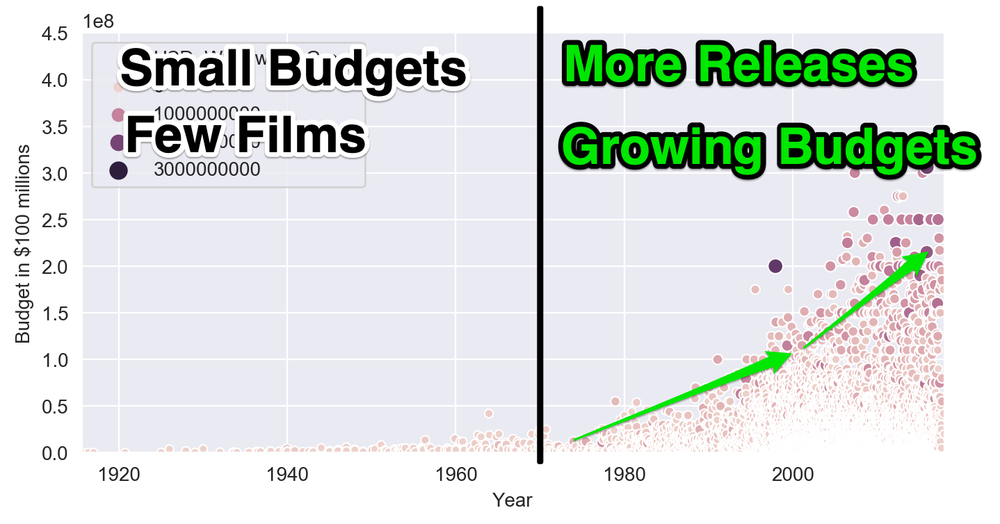

# Converting Years to Decades Trick

**Challenge**: Create a column in `data_clean` that has the decade of the release. 

<img src=https://i.imgur.com/0VEfagw.png width=650> 

Here's how: 
1. Create a [`DatetimeIndex` object](https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.DatetimeIndex.html) from the Release_Date column. 
2. Grab all the years from the `DatetimeIndex` object using the `.year` property.
<img src=https://i.imgur.com/5m06Ach.png width=650>
3. Use floor division `//` to convert the year data to the decades of the films.
4. Add the decades as a `Decade` column to the `data_clean` DataFrame.

In [300]:
dt_index = pd.DatetimeIndex(data_clean.Release_Date)

In [301]:
years = dt_index.year

In [302]:
decades = years//10*10
data_clean['Decade']= decades

MOre elgant way is to use:
    data_clean['Decade'] = data_clean.Release_Date.dt.year // 10 * 10

In [313]:
data_clean.drop(['years'], axis=1, inplace=True)

In [314]:
data_clean.head()

,Rank,Release_Date,Movie_Title,USD_Production_Budget,USD_Worldwide_Gross,USD_Domestic_Gross,Decade
0,5293,1915-08-02,The Birth of a Nation,110000,11000000,10000000,1910
1,5140,1916-05-09,Intolerance,385907,0,0,1910
2,5230,1916-12-24,"20,000 Leagues Under the Sea",200000,8000000,8000000,1910
3,5299,1920-09-17,Over the Hill to the Poorhouse,100000,3000000,3000000,1920
4,5222,1925-01-01,The Big Parade,245000,22000000,11000000,1920


### Separate the "old" (before 1969) and "New" (1970s onwards) Films

**Challenge**: Create two new DataFrames: `old_films` and `new_films`
* `old_films` should include all the films before 1969 (up to and including 1969)
* `new_films` should include all the films from 1970 onwards
* How many films were released prior to 1970?
* What was the most expensive film made prior to 1970?

In [324]:
old_films = data_clean.query('Decade<=1969')
new_films = data_clean.query('Decade>1970')

How many of our films were released prior to 1970?

In [325]:
len(old_films)

153

What was the most expensive film made prior to 1970?

In [326]:
old_films.sort_values('USD_Production_Budget', ascending=False)

,Rank,Release_Date,Movie_Title,USD_Production_Budget,USD_Worldwide_Gross,USD_Domestic_Gross,Decade
109,1253,1963-12-06,Cleopatra,42000000,71000000,57000000,1960
150,2175,1969-12-16,"Hello, Dolly",24000000,33208099,33208099,1960
143,2465,1969-01-01,Sweet Charity,20000000,8000000,8000000,1960
118,2425,1965-02-15,The Greatest Story Ever Told,20000000,15473333,15473333,1960
148,2375,1969-10-15,Paint Your Wagon,20000000,31678778,31678778,1960
...,...,...,...,...,...,...,...
147,5228,1969-07-25,The Stewardesses,200000,25000000,13500000,1960
29,5283,1942-11-16,Cat People,134000,8000000,4000000,1940
135,5292,1968-01-10,Night of the Living Dead,114000,30000000,12000000,1960
0,5293,1915-08-02,The Birth of a Nation,110000,11000000,10000000,1910


Cleopatra was the most expensive film prior to 1970.
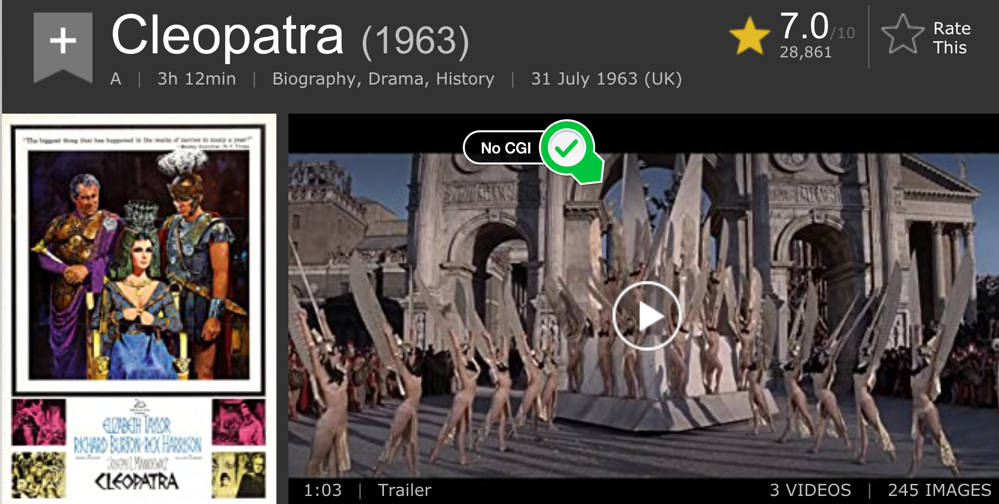

How many of our films were released after 1970?

In [327]:
len(new_films)

5029

# Seaborn Regression Plots

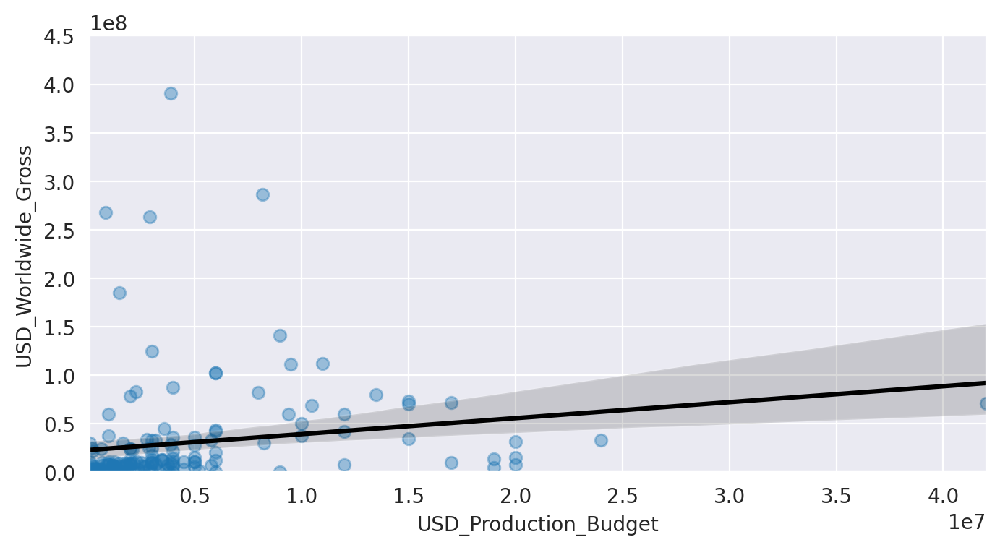

In [338]:
plt.figure(figsize=(8,4), dpi=200)
with sns.axes_style("darkgrid"):
    ax = sns.regplot(data=old_films, 
            x='USD_Production_Budget',
            y='USD_Worldwide_Gross',
            scatter_kws = {'alpha': 0.4},
            line_kws = {'color': 'black'})
    ax.set(ylim=(0, 450000000),
    xlabel='USD_Production_Budget',
    ylabel='USD_Worldwide_Gross')

Well, first off we can spot Cleopatra on the far right. But also, we see that many lower budget films made much more money! The relationship between the production budget and movie revenue is not very strong. Many points on the left are very far away for the line, so the line appears not to capture the relationship between budget and revenue very well at all!

But does the same hold true for the newer films?

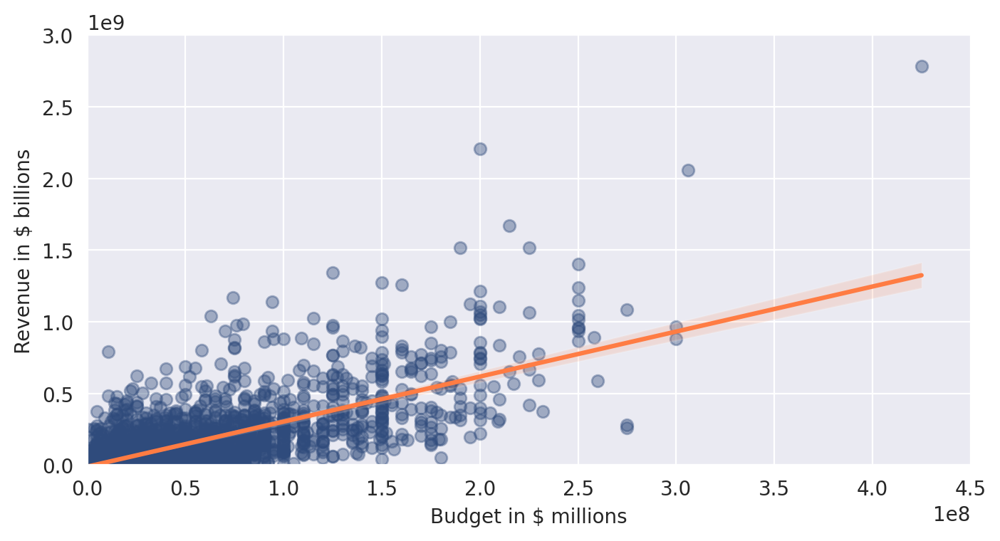

In [351]:
plt.figure(figsize=(8,4), dpi=200)
with sns.axes_style("darkgrid"):
    ax = sns.regplot(data=new_films, 
            x='USD_Production_Budget',
            y='USD_Worldwide_Gross',
            color='#2f4b7c',         
            scatter_kws = {'alpha':0.4},
            line_kws = {'color': '#ff7c43'})
    ax.set(ylim=(0, 3000000000),
           xlim=(0, 450000000),
    xlabel='Budget in $ millions',
    ylabel='Revenue in $ billions')

How do we interpret our chart? This time we are getting a much better fit, compared to the old films. We can see this visually from the fact that our data points line up much better with our regression line (pun intended). Also, the confidence interval is much narrower. We also see that a film with a 150 million budget is predicted to make slightly under 500 million by our regression line.

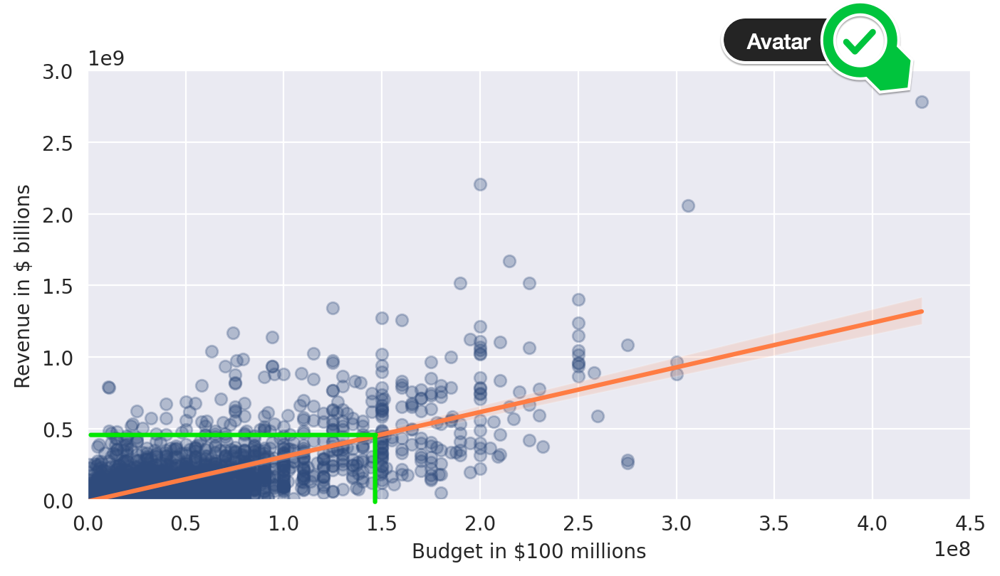

All in all, we can be pretty confident that there does indeed seem to be a relationship between a film's budget and that film's worldwide revenue.

But how much of the variation in revenue does the budget actually explain? And how much extra revenue can we expect for an additional dollar increase in the budget? To find out, we need to dive into the numbers underlying our regression model.

# Run Your Own Regression with scikit-learn

$$ REV \hat ENUE = \theta _0 + \theta _1 BUDGET$$

**Challenge**: Run a linear regression for the `old_films`. Calculate the intercept, slope and r-squared. How much of the variance in movie revenue does the linear model explain in this case?

In [371]:
from sklearn.linear_model import LinearRegression

In [372]:
regression = LinearRegression()

In [373]:
# Explanatory Variable(s) or Feature(s)
X = pd.DataFrame(new_films, columns=['USD_Production_Budget'])
# Response Variable or Target
y = pd.DataFrame(new_films, columns=['USD_Worldwide_Gross'])

In [374]:
# Find the best-fit line
regression.fit(X, y)

LinearRegression()

In [375]:
regression.intercept_

array([-10214386.67957918])

In [376]:
regression.coef_

array([[3.14148902]])

How do we interpret the y-intercept? Literally, means that if a movie budget is 0, the estimated movie revenue is -8.65 million. Hmm... so this is clearly unrealistic. Why would our model tell us such nonsense? Well, the reason is that we are specifying what the model should be ahead of time - namely a straight line - and then finding the best straight line for our data. Considering that you can't have negative revenue or a negative budget, we have to be careful about interpreting our very simple model too literally. After all, it's just an estimate and this estimate will be the most accurate on the chart where we have the most data points (rather than at the extreme left or right).

What about the slope? The slope tells us that for every extra dollar in the budget, movie revenue increases by 3.1. dollar So, that's pretty interesting. That means the higher our budget, the higher our estimated revenue. If budgets are all that matter to make lots of money, then studio executives and film financiers should try and produce the biggest films possible, right? Maybe that's exactly why we've seen a massive increase in budgets over the past 30 years.
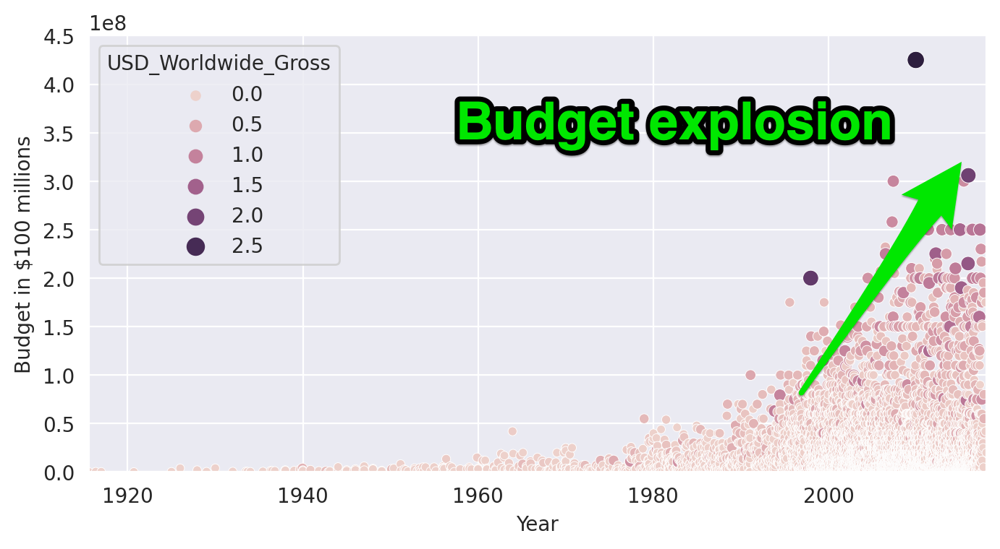

Our LinearRegression does not like receiving Pandas Series (e.g., new_films.USD_Production_Budget), so I've created some new DataFrames here.

In [364]:
regression.score(X, y)

0.5653308754006352

We see that our r-squared comes in at around 0.558. This means that our model explains about 56% of the variance in movie revenue.

In [377]:
budget = 350000000
revenue_estimate = regression.intercept_[0] + regression.coef_[0,0]*budget
revenue_estimate = round(revenue_estimate, -6)
print(f'The estimated revenue for a $350 film is around ${revenue_estimate:.10}.')

The estimated revenue for a $350 film is around $1.089e+09.


In [366]:
# Explanatory Variable(s) or Feature(s)
X = pd.DataFrame(old_films, columns=['USD_Production_Budget'])
# Response Variable or Target
y = pd.DataFrame(old_films, columns=['USD_Worldwide_Gross'])

In [367]:
regression.fit(X, y)

LinearRegression()

In [368]:
regression.intercept_

array([22821538.63508039])

In [369]:
regression.coef_

array([[1.64771314]])

In [370]:
regression.score(X, y)

0.02937258620576877

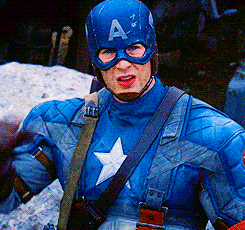